In [1]:
# ==========================================
# 1. ENVIRONMENT SETUP
# ==========================================
from google.colab import drive
drive.mount('/content/drive')

# Install YOLOv8 library
!pip install ultralytics

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 67.4 MB/s eta 0:00:00


In [3]:
# ==========================================
# 2. PREPARE LOCAL DATASET FOR STAGE 1 (YOLO)
# ==========================================
import os
import shutil

drive_label_dir = "/content/drive/MyDrive/COS30018_fall_detection_project/labels"
local_label_dir = "/content/yolo_person_dataset/labels"

drive_img_dir = "/content/drive/MyDrive/COS30018_fall_detection_project/images"
local_img_dir = "/content/yolo_person_dataset/images"

# --- Step A: Process and copy labels (Mapping all classes to 0: person) ---
print("⚙️ Preparing local YOLO labels...")
for split in ["train", "val"]:
    drive_folder = os.path.join(drive_label_dir, split)
    local_folder = os.path.join(local_label_dir, split)
    os.makedirs(local_folder, exist_ok=True)

    if not os.path.exists(drive_folder):
        print(f"⚠️ Warning: Drive label folder not found for split: {split}")
        continue

    for file in os.listdir(drive_folder):
        if not file.endswith(".txt"):
            continue

        src_path = os.path.join(drive_folder, file)
        dst_path = os.path.join(local_folder, file)

        with open(src_path, "r") as f:
            lines = f.readlines()

        new_lines = []
        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:
                parts[0] = "0"  # Force class to 0 (Person) for Stage 1
                new_lines.append(" ".join(parts))

        # Write labels (even if empty, to support background images)
        with open(dst_path, "w") as f:
            f.write("\n".join(new_lines))

print("✅ Local YOLO labels prepared.")

# --- Step B: Copy matching images ---
print("\n⚙️ Copying matching images to local disk...")
for split in ["train", "val"]:
    drive_folder = os.path.join(drive_img_dir, split)
    local_folder = os.path.join(local_img_dir, split)
    os.makedirs(local_folder, exist_ok=True)

    if not os.path.exists(drive_folder):
        print(f"⚠️ Warning: {split} image folder not found on Drive.")
        continue

    # Only copy images that have matching prepared labels
    local_label_folder = f"/content/yolo_person_dataset/labels/{split}"
    if os.path.exists(local_label_folder):
        labels_present = os.listdir(local_label_folder)
        label_basenames = [os.path.splitext(f)[0] for f in labels_present]
    else:
        label_basenames = []

    count = 0
    for img_file in os.listdir(drive_folder):
        if not img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        img_base = os.path.splitext(img_file)[0]
        if img_base in label_basenames:
            shutil.copy(os.path.join(drive_folder, img_file), os.path.join(local_folder, img_file))
            count += 1

    print(f"✅ Synced {count} images for {split}")

⚙️ Preparing local YOLO labels...
✅ Local YOLO labels prepared.

⚙️ Copying matching images to local disk...
✅ Synced 719 images for train
✅ Synced 171 images for val


In [4]:
# ==========================================
# 3. CONFIGURE & TRAIN YOLOv8
# ==========================================
import os
import shutil
from ultralytics import YOLO

# Create YAML configuration
yolo_path = "/content/yolo_person_dataset"
data_yaml = f"""
path: {yolo_path}
train: images/train
val: images/val

nc: 1
names:
  0: person
"""

with open("/content/person_data.yaml", "w") as f:
    f.write(data_yaml)

print("📝 YAML configuration file created.")

# Initialize and train the model
model = YOLO("yolov8s.pt")

model.train(
    data="/content/person_data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    workers=4,
    project="/content/runs",
    name="stage1_person_detector",
    exist_ok=True  # Keeps directory name consistent (no auto-append suffixes like -2)
)

# Copy the best model weight to Google Drive for backup
best_model_path = "/content/runs/stage1_person_detector/weights/best.pt"
drive_save_path = "/content/drive/MyDrive/COS30018_fall_detection_project/yolo_person.pt"


if os.path.exists(best_model_path):
    shutil.copy(best_model_path, drive_save_path)
    print(f"💾 Best model saved to Drive: {drive_save_path}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
📝 YAML configuration file created.
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/person_data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=

--- 📊 Calculating Validation Metrics ---
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
Model summary (fused): 73 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3090.0±2178.9 MB/s, size: 2028.1 KB)
val: Scanning /content/yolo_person_dataset/labels/val.cache... 171 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 171/171 59.8Mit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 83, len(boxes) = 197. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 11/11 2.1it/s 5.2s
                   all        171        197       0.96      0.883      0.942      0.687
Speed: 1.4ms preprocess, 7.3ms inference, 0.0ms loss, 0.9ms postp

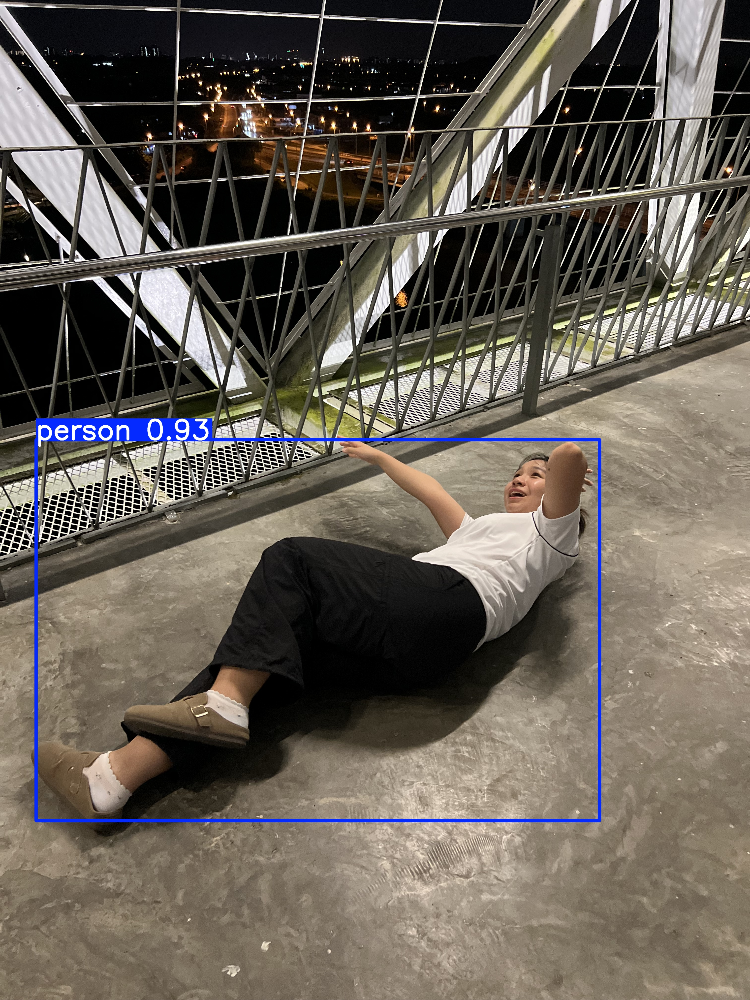


Prediction for image0.jpg:


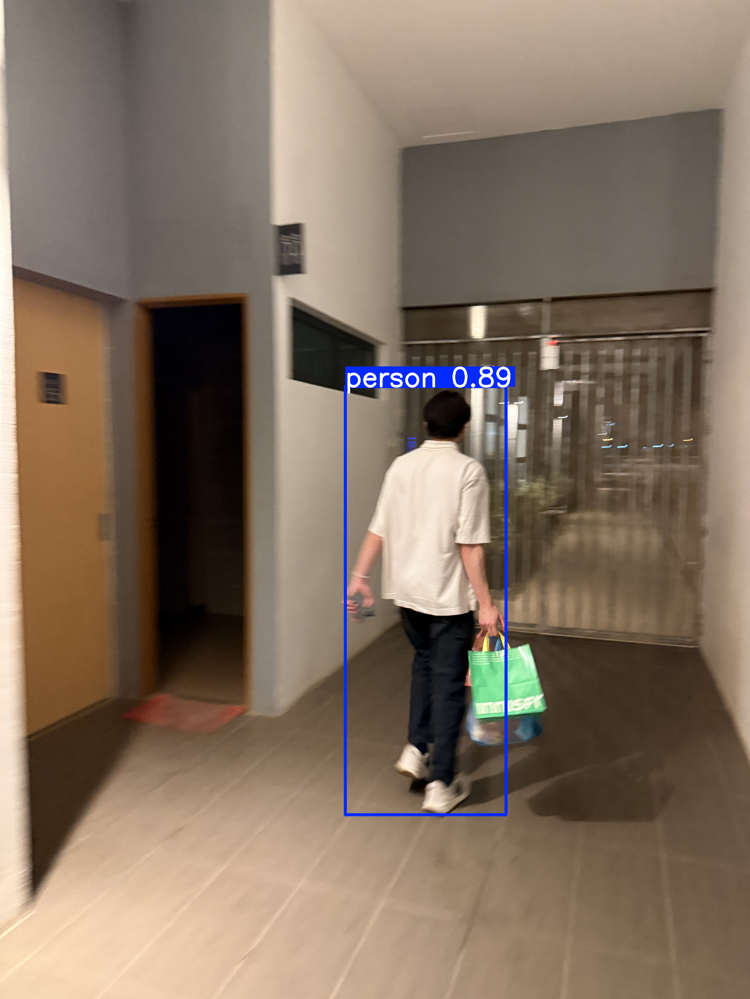


Prediction for image1.jpg:


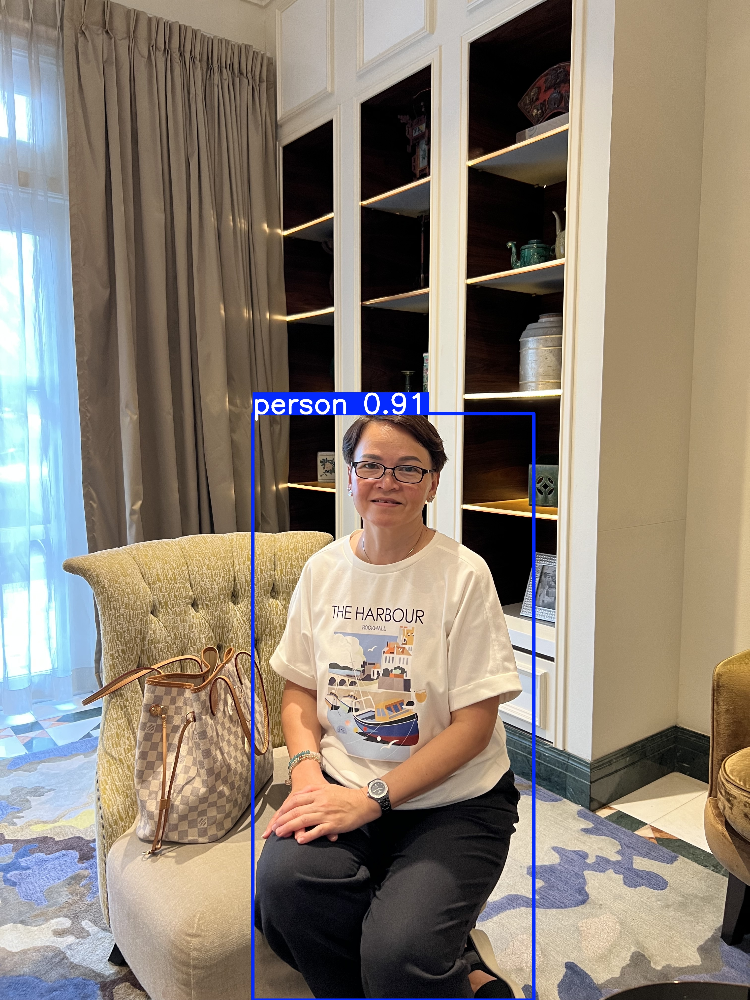

In [5]:
# ==========================================
# 4. EVALUATE YOLOv8
# ==========================================
import os
import glob
import random
from ultralytics import YOLO
from IPython.display import Image, display

# Load the trained model
yolo_model_path = '/content/drive/MyDrive/COS30018_fall_detection_project/yolo_person.pt'
model = YOLO(yolo_model_path)

# --- Quantitative Validation ---
print("--- 📊 Calculating Validation Metrics ---")
metrics = model.val(data='/content/person_data.yaml')

print("\n📝 YOLOv8 Evaluation Results:")
print(f"Mean Average Precision @ 50 (mAP50): {metrics.box.map50:.4f}")
print(f"Recall: {metrics.box.r.mean():.4f}")
print(f"Precision: {metrics.box.p.mean():.4f}")

# --- Qualitative Validation (Visual Test) ---
print("\n--- 👁️ Visual Test on Unseen Test Images ---")
test_img_dir = '/content/drive/MyDrive/COS30018_fall_detection_project/images/test'
test_images = glob.glob(f"{test_img_dir}/*.*")

if len(test_images) == 0:
    print(f"⚠️ No test images found in {test_img_dir}. Check your path!")
else:
    # Pick up to 3 random samples
    num_to_test = min(3, len(test_images))
    sample_images = random.sample(test_images, num_to_test)

    # Run predictions
    results = model.predict(
        source=sample_images,
        conf=0.4,
        save=True,
        project='/content/yolo_eval_results',
        name='visual_test',
        exist_ok=True,
        verbose=False
    )

    # Render results
    result_folder = '/content/yolo_eval_results/visual_test'
    for img_file in os.listdir(result_folder):
        if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            print(f"\nPrediction for {img_file}:")
            display(Image(filename=os.path.join(result_folder, img_file), width=600))

📊 Ground Truth Validation Labels:


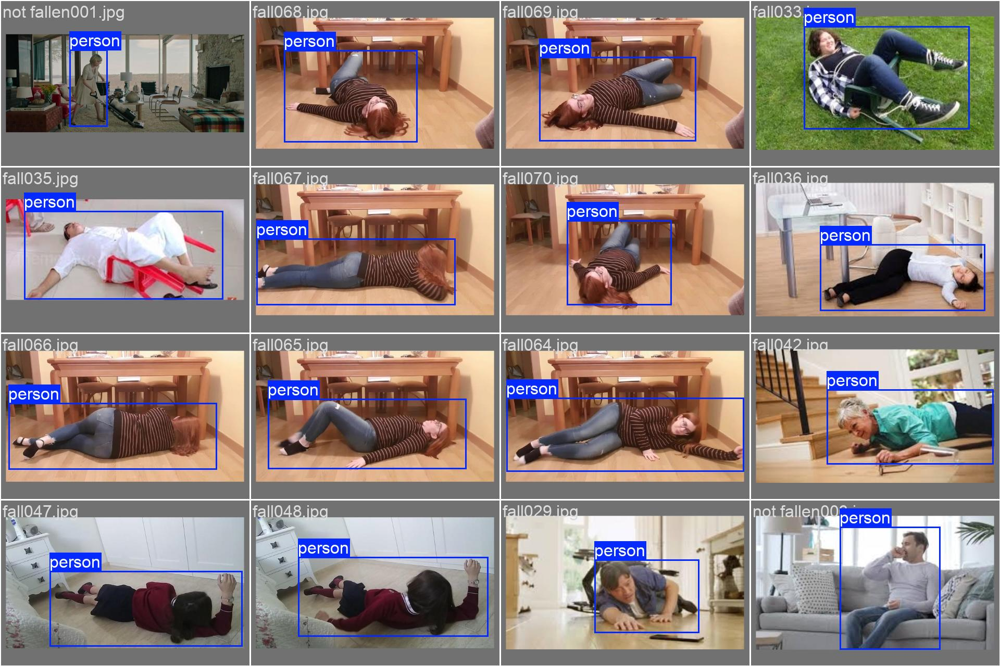

In [6]:
from IPython.display import Image, display
import os

# Check the validation batch with actual ground-truth labels
gt_val_path = "/content/runs/stage1_person_detector/val_batch0_labels.jpg"

if os.path.exists(gt_val_path):
    print("📊 Ground Truth Validation Labels:")
    display(Image(filename=gt_val_path, width=800))
else:
    # Try the training batch if val is missing
    gt_train_path = "/content/runs/stage1_person_detector/train_batch0.jpg"
    if os.path.exists(gt_train_path):
        print("📊 Ground Truth Training Labels:")
        display(Image(filename=gt_train_path, width=800))
    else:
        print("⚠️ Diagnostic images not found. Double check your run folder.")

In [7]:
# ==========================================
# 5. CROP EXTRACTION & BALANCING
# ==========================================
import os
import cv2

drive_path = "/content/drive/MyDrive/COS30018_fall_detection_project"
resnet_dataset = "/content/resnet_dataset"

# Map matches original label index configuration
class_map = {
    0: "fall",
    1: "walk",
    2: "sit"
}

def extract_crops(split):
    img_dir = f"{drive_path}/images/{split}"
    lbl_dir = f"{drive_path}/labels/{split}"

    print(f"\n--- ⚖️ Processing and Balancing {split} crops ---")

    for cls_name in class_map.values():
        os.makedirs(f"{resnet_dataset}/{split}/{cls_name}", exist_ok=True)

    count = 0
    for img_name in os.listdir(img_dir):
        if not img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue

        img_path = os.path.join(img_dir, img_name)
        lbl_base = os.path.splitext(img_name)[0]
        lbl_path = os.path.join(lbl_dir, f"{lbl_base}.txt")

        if not os.path.exists(lbl_path):
            continue

        img = cv2.imread(img_path)
        if img is None:
            continue
        h, w = img.shape[:2]

        with open(lbl_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue

                cls_id = int(parts[0])
                if cls_id not in class_map:
                    continue
                cls_name = class_map[cls_id]

                coords = list(map(float, parts[1:]))

                # YOLO bounding box handling
                if len(parts) == 5:
                    x, y, bw, bh = coords
                    x1 = int((x - bw/2) * w)
                    y1 = int((y - bh/2) * h)
                    x2 = int((x + bw/2) * w)
                    y2 = int((y + bh/2) * h)
                # YOLO segmentation polygon handling
                else:
                    xs = coords[0::2]
                    ys = coords[1::2]
                    x1, x2 = int(min(xs) * w), int(max(xs) * w)
                    y1, y2 = int(min(ys) * h), int(max(ys) * h)

                # Add padding for better pose context
                pad = 30
                x1 = max(0, x1 - pad)
                y1 = max(0, y1 - pad)
                x2 = min(w, x2 + pad)
                y2 = min(h, y2 + pad)

                crop = img[y1:y2, x1:x2]
                if crop.size == 0:
                    continue

                # Save original crop
                save_name = f"{count}_{img_name}"
                save_path = f"{resnet_dataset}/{split}/{cls_name}/{save_name}"
                cv2.imwrite(save_path, crop)
                count += 1

                # Data Balancing: Flip sit/walk on the train set to improve balance
                if cls_name in ["sit", "walk"] and split == "train":
                    flipped_crop = cv2.flip(crop, 1)
                    flip_path = f"{resnet_dataset}/{split}/{cls_name}/flip_{save_name}"
                    cv2.imwrite(flip_path, flipped_crop)
                    count += 1

    print(f"✅ Extracted {count} crops for {split}")

# Run extraction
extract_crops("train")
extract_crops("val")

# Print distribution summary
print("\n📊 Final Dataset Distribution")
for split in ["train", "val"]:
    print(f"--- {split.upper()} ---")
    for cls_name in class_map.values():
        folder = f"{resnet_dataset}/{split}/{cls_name}"
        total = len(os.listdir(folder)) if os.path.exists(folder) else 0
        print(f"{cls_name}: {total}")


--- ⚖️ Processing and Balancing train crops ---
✅ Extracted 1479 crops for train

--- ⚖️ Processing and Balancing val crops ---
✅ Extracted 197 crops for val

📊 Final Dataset Distribution
--- TRAIN ---
fall: 341
walk: 440
sit: 698
--- VAL ---
fall: 101
walk: 48
sit: 48


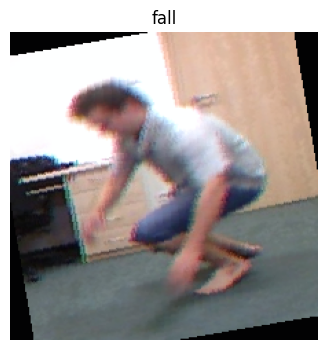

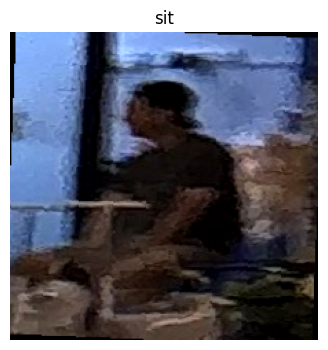

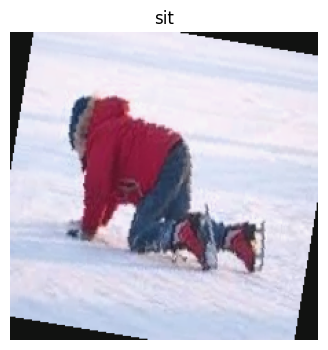

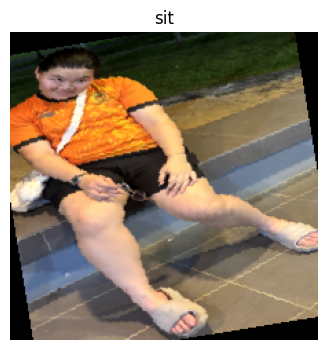

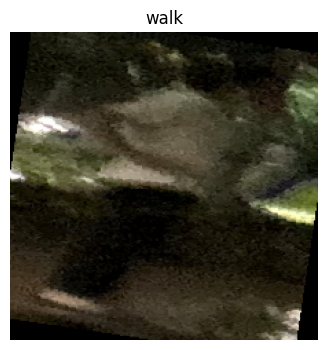

In [13]:
import matplotlib.pyplot as plt
import random

for i in random.sample(range(len(train_data)), 5):
    img, label = train_data[i]

    img = img.permute(1,2,0).numpy()
    img = img * [0.229,0.224,0.225] + [0.485,0.456,0.406]

    plt.figure(figsize=(4,4))
    plt.imshow(img.clip(0,1))
    plt.title(train_data.classes[label])
    plt.axis("off")
    plt.show()

In [8]:
# ==========================================
# 6. PYTORCH DATA PIPELINES
# ==========================================
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Training Transform (Robust Augmentation)
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),                       # Helps recognize tilted/diagonal poses
    transforms.ColorJitter(brightness=0.2, contrast=0.2), # Standardizes varying camera lighting
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Validation Transform (Strictly Clean)
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Initialize folders
train_data = datasets.ImageFolder(f"{resnet_dataset}/train", transform=train_transform)
val_data = datasets.ImageFolder(f"{resnet_dataset}/val", transform=val_transform)

# Build DataLoaders
train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
val_loader = DataLoader(val_data, batch_size=32, shuffle=False)

print(f"📂 Found classes: {train_data.classes}")
print(f"🔢 Class Index Mapping: {train_data.class_to_idx}")

📂 Found classes: ['fall', 'sit', 'walk']
🔢 Class Index Mapping: {'fall': 0, 'sit': 1, 'walk': 2}


In [9]:
# ==========================================
# 7. MODEL INSTANTIATION
# ==========================================
import torch
import torch.nn as nn
from torchvision import models

device = "cuda" if torch.cuda.is_available() else "cpu"

# Load pre-trained ResNet-18 model
model_resnet = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

# Adjust classification output layer (no frozen weights)
num_ftrs = model_resnet.fc.in_features
model_resnet.fc = nn.Linear(num_ftrs, 3)

model_resnet = model_resnet.to(device)
print(f"🚀 Unfrozen ResNet-18 initialized on: {device.upper()}")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 232MB/s]

🚀 Unfrozen ResNet-18 initialized on: CUDA


In [29]:
# ==========================================
# 8. TRAINING STAGE 2 ACTION CLASSIFIER
# ==========================================
import os
import torch.optim as optim
import torch.nn as nn
from torch.optim.lr_scheduler import CosineAnnealingLR

# --- CHECKPOINT PATH SETUP ---
# Pre-defining paths locally here to prevent NameError when saving inside the loop
save_dir = "/content/drive/MyDrive/COS30018_fall_detection_project/models"
os.makedirs(save_dir, exist_ok=True)
resnet_save_path = os.path.join(save_dir, "resnet_fall_classifier.pth")

# Class weighting matching the dataset order [fall, sit, walk]
class_weights = torch.FloatTensor([1.0, 4.0, 3.0]).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

# Adam optimizer
optimizer = optim.Adam(model_resnet.parameters(), lr=0.0001)

epochs = 25
# Gradually decays learning rate over the 25 epochs using a cosine curve
scheduler = CosineAnnealingLR(optimizer, T_max=epochs)

# --- EARLY STOPPING & CHECKPOINT VARIABLES ---
best_val_acc = 0.0
patience = 5             # Stop training if val_acc doesn't improve for 5 epochs
patience_counter = 0

print(f"🏋️ Starting ResNet Training ({epochs} Epochs)...")

for epoch in range(epochs):
    # --- Training Phase ---
    model_resnet.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model_resnet(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_acc = 100 * correct / total

    # --- Validation Phase ---
    model_resnet.eval()
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model_resnet(inputs)
            _, predicted = torch.max(outputs.data, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_acc = 100 * val_correct / val_total

    # Decay the learning rate
    scheduler.step()

    # --- CHECKPOINT & EARLY STOPPING LOGIC ---
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        # Save model weights ONLY when validation accuracy reaches a new peak
        torch.save(model_resnet.state_dict(), resnet_save_path)
        patience_counter = 0  # Reset patience counter
        checkpoint_msg = f"⭐ Best model saved (Val Acc: {val_acc:.2f}%)"
    else:
        patience_counter += 1
        checkpoint_msg = f"No improvement (Patience: {patience_counter}/{patience})"

    print(
        f"Epoch {epoch+1:02d}/{epochs:02d} | "
        f"Loss: {running_loss/len(train_loader):.4f} | "
        f"Train Acc: {train_acc:.2f}% | "
        f"Val Acc: {val_acc:.2f}% | "
        f"{checkpoint_msg}"
    )

    # Trigger early stopping
    if patience_counter >= patience:
        print(f"\n🛑 Early stopping triggered! Training halted at Epoch {epoch+1}.")
        print(f"🏆 Best Validation Accuracy achieved: {best_val_acc:.2f}%")
        break

print("✅ ResNet Classifier Training Complete!")

🏋️ Starting ResNet Training (25 Epochs)...
Epoch 01/25 | Loss: 0.0239 | Train Acc: 98.65% | Val Acc: 88.83% | ⭐ Best model saved (Val Acc: 88.83%)
Epoch 02/25 | Loss: 0.0085 | Train Acc: 99.59% | Val Acc: 89.85% | ⭐ Best model saved (Val Acc: 89.85%)
Epoch 03/25 | Loss: 0.0258 | Train Acc: 99.59% | Val Acc: 90.36% | ⭐ Best model saved (Val Acc: 90.36%)
Epoch 04/25 | Loss: 0.0560 | Train Acc: 98.92% | Val Acc: 91.37% | ⭐ Best model saved (Val Acc: 91.37%)
Epoch 05/25 | Loss: 0.0540 | Train Acc: 98.31% | Val Acc: 83.25% | No improvement (Patience: 1/5)
Epoch 06/25 | Loss: 0.0263 | Train Acc: 98.58% | Val Acc: 88.83% | No improvement (Patience: 2/5)
Epoch 07/25 | Loss: 0.0179 | Train Acc: 99.39% | Val Acc: 86.80% | No improvement (Patience: 3/5)
Epoch 08/25 | Loss: 0.0081 | Train Acc: 99.73% | Val Acc: 90.86% | No improvement (Patience: 4/5)
Epoch 09/25 | Loss: 0.0069 | Train Acc: 99.66% | Val Acc: 93.91% | ⭐ Best model saved (Val Acc: 93.91%)
Epoch 10/25 | Loss: 0.0069 | Train Acc: 99.80

--- Found 5 misclassifications to analyze ---


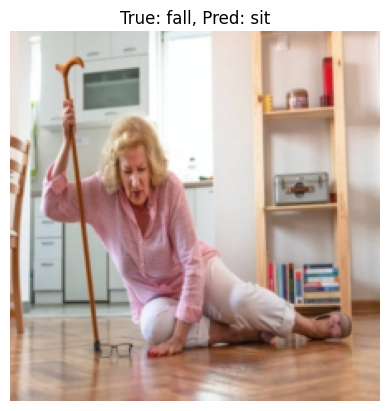

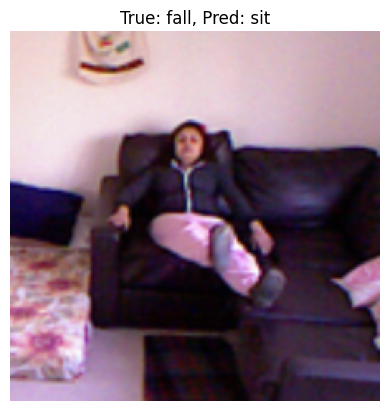

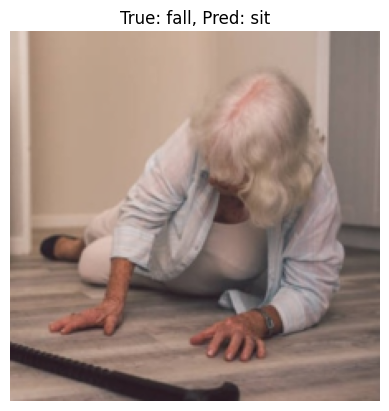

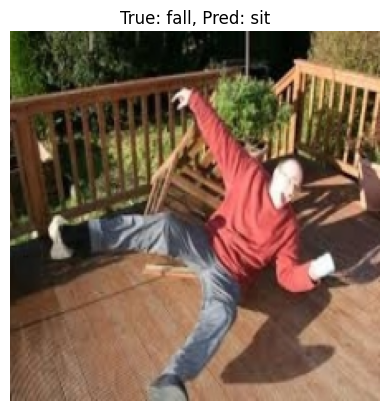

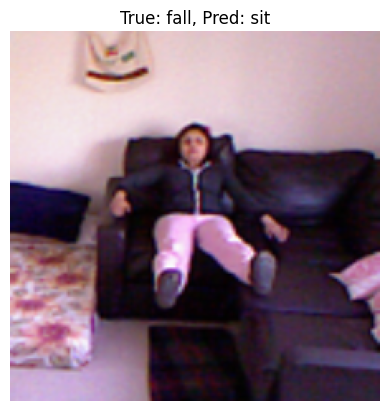

In [30]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import os

def visualize_errors(model, loader, class_map):
    model.eval()
    errors = []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)

            # Find indices where prediction != actual
            mask = (predicted != labels)

            for i in range(len(mask)):
                if mask[i]:
                    errors.append({
                        'input': inputs[i].cpu(),
                        'pred': predicted[i].item(),
                        'true': labels[i].item()
                    })

            if len(errors) >= 5: break # Only show first 5 errors

    # Display the errors
    print(f"--- Found {len(errors)} misclassifications to analyze ---")
    for err in errors:
        img = err['input'].permute(1, 2, 0).numpy()
        # Un-normalize for display
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)

        plt.imshow(img)
        plt.title(f"True: {class_map[err['true']]}, Pred: {class_map[err['pred']]}")
        plt.axis('off')
        plt.show()

# Define your class map based on your earlier setup
class_map = {0: 'fall', 1: 'sit', 2: 'walk'}
visualize_errors(model_resnet, val_loader, class_map)


===== FALL =====


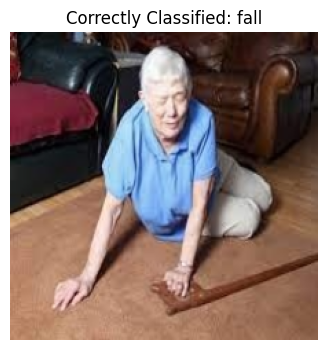

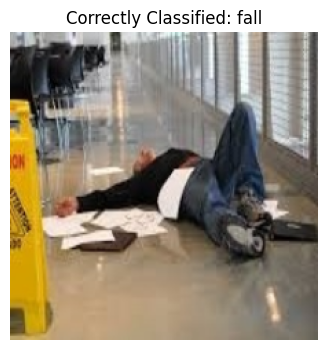

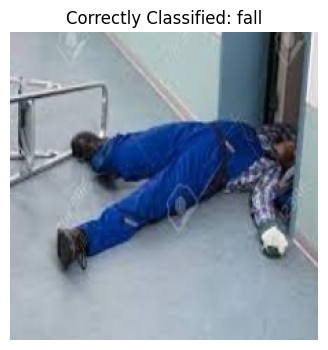


===== SIT =====


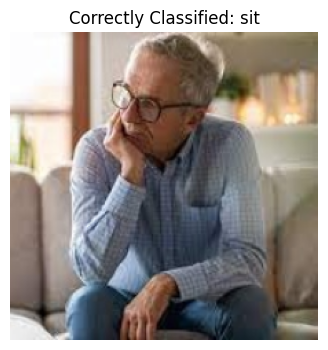

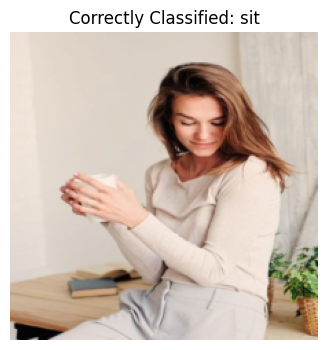

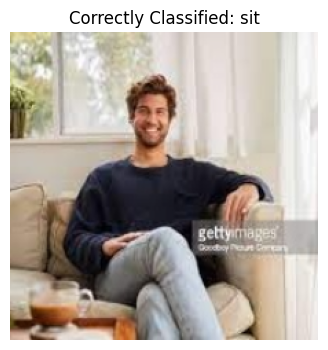


===== WALK =====


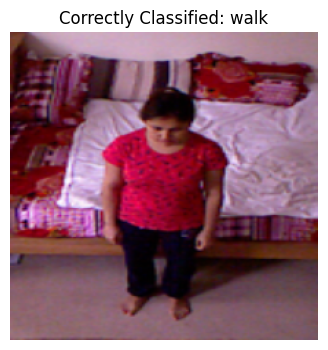

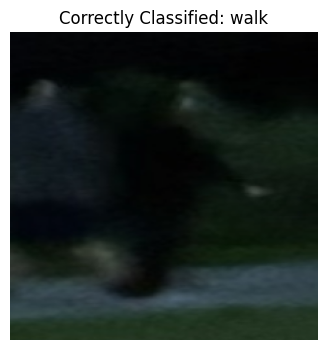

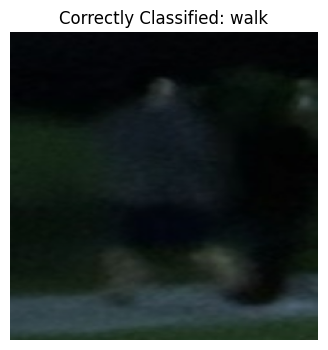

In [31]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def visualize_correct_per_class(model, loader, class_names, per_class=3):
    model.eval()

    correct_by_class = {i: [] for i in range(len(class_names))}

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)

            for i in range(len(labels)):
                true_class = labels[i].item()

                if predicted[i] == labels[i]:
                    if len(correct_by_class[true_class]) < per_class:
                        correct_by_class[true_class].append(
                            inputs[i].cpu()
                        )

            # Stop when every class has enough examples
            if all(len(v) >= per_class for v in correct_by_class.values()):
                break

    # Display results
    for class_idx, images in correct_by_class.items():

        print(f"\n===== {class_names[class_idx].upper()} =====")

        for img_tensor in images:

            img = img_tensor.permute(1, 2, 0).numpy()

            # Un-normalize
            img = img * np.array([0.229, 0.224, 0.225]) + \
                  np.array([0.485, 0.456, 0.406])

            img = np.clip(img, 0, 1)

            plt.figure(figsize=(4,4))
            plt.imshow(img)
            plt.title(f"Correctly Classified: {class_names[class_idx]}")
            plt.axis("off")
            plt.show()

# Run
class_names = ['fall', 'sit', 'walk']

visualize_correct_per_class(
    model_resnet,
    val_loader,
    class_names,
    per_class=3
)

In [17]:
import os
# Count how many files are in your sit/walk/fall folders
for cls in ['fall', 'sit', 'walk']:
    path = f"/content/resnet_dataset/val/{cls}"
    print(f"{cls} count: {len(os.listdir(path))}")

fall count: 101
sit count: 48
walk count: 48


In [32]:
# ==========================================
# 9. PERSIST MODELS TO DRIVE
# ==========================================
import os
import shutil
import torch

# Create save destination on Drive
save_dir = "/content/drive/MyDrive/project_fall_detection/models"
os.makedirs(save_dir, exist_ok=True)

# Save ResNet model dictionary
resnet_save_path = os.path.join(save_dir, "resnet_fall_classifier.pth")
torch.save(model_resnet.state_dict(), resnet_save_path)
print(f"✅ ResNet model saved to: {resnet_save_path}")

# Copy YOLO model checkpoint (using consistent folder names)
yolo_source = "/content/runs/stage1_person_detector/weights/best.pt"
yolo_destination = os.path.join(save_dir, "yolo_person_detector.pt")

if os.path.exists(yolo_source):
    shutil.copy(yolo_source, yolo_destination)
    print(f"✅ YOLO model copied to: {yolo_destination}")
else:
    print(f"⚠️ Source file {yolo_source} was not found. Copy manually if needed.")

# Create a class index reference map
with open(os.path.join(save_dir, "classes.txt"), "w") as f:
    f.write("0: fall\n1: walk\n2: sit")
print(f"✅ Class definitions file written to: {os.path.join(save_dir, 'classes.txt')}")

✅ ResNet model saved to: /content/drive/MyDrive/project_fall_detection/models/resnet_fall_classifier.pth
✅ YOLO model copied to: /content/drive/MyDrive/project_fall_detection/models/yolo_person_detector.pt
✅ Class definitions file written to: /content/drive/MyDrive/project_fall_detection/models/classes.txt


Using device: cuda
--- 🔍 Scanning Test Folder: /content/drive/MyDrive/COS30018_fall_detection_project/images/test ---

--- 📊 SYSTEM PERFORMANCE REPORT ---
               precision    recall  f1-score   support

         fall       0.63      0.77      0.69       172
         walk       0.85      0.42      0.56       108
          sit       0.57      0.36      0.44        75
Missed Detect       0.00      0.00      0.00         0

     accuracy                           0.57       355
    macro avg       0.51      0.39      0.42       355
 weighted avg       0.69      0.57      0.60       355



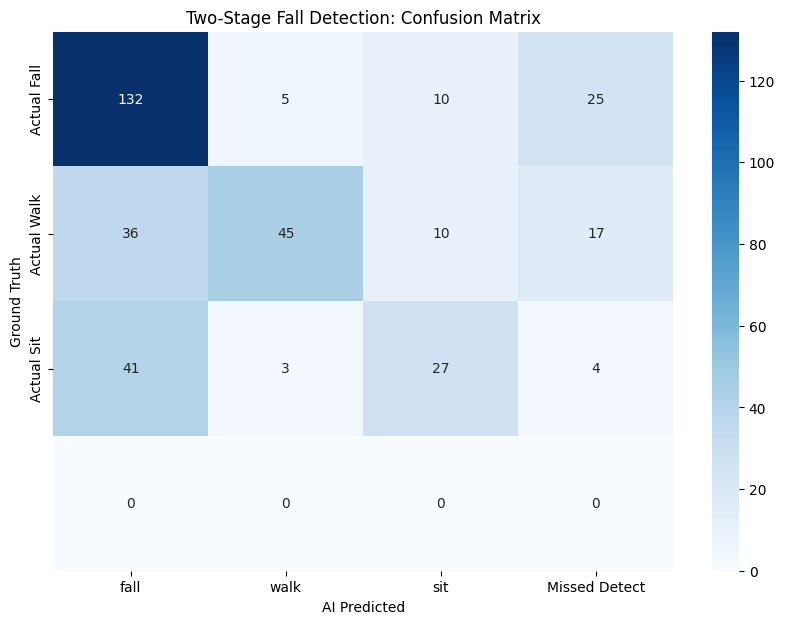

In [33]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
from ultralytics import YOLO
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================================
# 1. PATH SETUP
# ==========================================
DRIVE_BASE = '/content/drive/MyDrive/COS30018_fall_detection_project'
TEST_IMG_PATH = f'{DRIVE_BASE}/images/test'
TEST_LBL_PATH = f'{DRIVE_BASE}/labels/test'

# UPDATED: Pointing directly to the verified location of your YOLO model
YOLO_MODEL_PATH = f'{DRIVE_BASE}/yolo_person.pt'
RESNET_MODEL_PATH = f'{DRIVE_BASE}/models/resnet_fall_classifier.pth'

# ==========================================
# 2. LOAD MODELS
# ==========================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model_yolo = YOLO(YOLO_MODEL_PATH)

model_resnet = models.resnet18()
model_resnet.fc = nn.Linear(model_resnet.fc.in_features, 3)
model_resnet.load_state_dict(torch.load(RESNET_MODEL_PATH, map_location=device))
model_resnet.to(device).eval()

# ==========================================
# 3. SETTINGS
# ==========================================
resnet_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])
])

y_true = []
y_pred = []

# ==========================================
# 4. EVALUATION LOOP
# ==========================================
print(f"--- 🔍 Scanning Test Folder: {TEST_IMG_PATH} ---")
all_files = [f for f in os.listdir(TEST_IMG_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

for img_name in all_files:
    # A. GET GROUND TRUTH (YOLO FORMAT: 0=fall, 1=walk, 2=sit)
    lbl_base = os.path.splitext(img_name)[0]
    lbl_path = os.path.join(TEST_LBL_PATH, f"{lbl_base}.txt")

    if not os.path.exists(lbl_path):
        continue

    with open(lbl_path, 'r') as f:
        line = f.readline()
        if not line:
            continue
        parts = line.split()
        current_true_idx = int(parts[0])

    if current_true_idx not in [0, 1, 2]:
        continue

    # B. PROCESS IMAGE
    img_path = os.path.join(TEST_IMG_PATH, img_name)
    try:
        img = Image.open(img_path).convert('RGB')
    except:
        continue

    # STAGE 1: YOLO Detection
    results = model_yolo(img, conf=0.3, verbose=False)

    if len(results[0].boxes) > 0:
        # STAGE 2: ResNet Classification
        box = results[0].boxes[0].xyxy[0].cpu().numpy().astype(int)

        # Apply pad=30 to match training crops
        w, h = img.size
        x1, y1, x2, y2 = box[0], box[1], box[2], box[3]
        pad = 30

        # Clamp coordinates to image boundaries
        x1 = max(0, x1 - pad)
        y1 = max(0, y1 - pad)
        x2 = min(w, x2 + pad)
        y2 = min(h, y2 + pad)

        crop = img.crop((x1, y1, x2, y2))

        input_tensor = resnet_transform(crop).unsqueeze(0).to(device)
        with torch.no_grad():
            output = model_resnet(input_tensor)
            _, pred = torch.max(output, 1)
            raw_pred = pred.item()

            # Translate from Alphabetical (0=fall, 1=sit, 2=walk)
            # back to YOLO Labels (0=fall, 1=walk, 2=sit)
            if raw_pred == 1:
                final_pred = 2 # Classified Sit, mapped to YOLO Sit (2)
            elif raw_pred == 2:
                final_pred = 1 # Classified Walk, mapped to YOLO Walk (1)
            else:
                final_pred = 0 # Fall is 0 for both

        y_true.append(current_true_idx)
        y_pred.append(final_pred)
    else:
        # Person was missed completely by YOLO
        y_true.append(current_true_idx)
        y_pred.append(-1)

# ==========================================
# 5. GENERATE FINAL REPORT
# ==========================================
if y_true:
    print("\n--- 📊 SYSTEM PERFORMANCE REPORT ---")
    labels = [0, 1, 2]
    target_names = ['fall', 'walk', 'sit']

    if -1 in y_pred:
        labels.append(-1)
        target_names.append('Missed Detect')

    print(classification_report(y_true, y_pred, labels=labels, target_names=target_names, zero_division=0))

    cm = confusion_matrix(y_true, y_pred, labels=labels)
    plt.figure(figsize=(10,7))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        xticklabels=target_names,
        yticklabels=['Actual Fall', 'Actual Walk', 'Actual Sit'],
        cmap='Blues'
    )
    plt.xlabel('AI Predicted')
    plt.ylabel('Ground Truth')
    plt.title('Two-Stage Fall Detection: Confusion Matrix')
    plt.show()
else:
    print("❌ Error: Could not find matching label files.")

In [35]:
from google.colab import files
import os

# Define the paths to your models in Google Drive
yolo_path = '/content/drive/MyDrive/COS30018_fall_detection_project/yolo_person.pt'
resnet_path = '/content/drive/MyDrive/COS30018_fall_detection_project/models/resnet_fall_classifier.pth'

# Function to safely download files
def download_model(file_path, model_name):
    if os.path.exists(file_path):
        print(f"✅ Preparing {model_name} for download...")
        files.download(file_path)
    else:
        print(f"❌ Error: {model_name} not found at {file_path}")

# Trigger the downloads
download_model(yolo_path, "YOLO Person Detector")
download_model(resnet_path, "ResNet Action Classifier")

✅ Preparing YOLO Person Detector for download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Preparing ResNet Action Classifier for download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>